# 🧠 MS Lesion Synthesis Inference Playground 🧠

In [1]:
import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler, StableDiffusionInpaintPipeline, UNet2DConditionModel, DDIMScheduler
from PIL import Image
from torchvision import transforms
import matplotlib.pyplot as plt
import os
import numpy as np

os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [2]:
def prepare_mask_and_masked_image(image, mask, black_mask=True, discretize_mask=True):
    image = np.array(image.convert("RGB"))
    # image = image[None].transpose(0, 3, 1, 2)
    image = image.transpose(2, 0, 1)
    image = torch.from_numpy(image).to(dtype=torch.float32) / 127.5 - 1.0

    mask = np.array(mask.convert("L"))
    mask = mask.astype(np.float32) / 255.0
    # mask = mask[None, None]
    mask = mask[None]
    if discretize_mask:
        mask[mask < 0.5] = 0
        mask[mask >= 0.5] = 1
    else:
        mask[mask < 0.0] = 0
        mask[mask >= 1.0] = 1
    mask = torch.from_numpy(mask)

    if black_mask:
        masked_image = image * (mask < 0.5) + (mask >= 0.5) * -1 if discretize_mask else image * (1 - mask)
    else:
        masked_image = image * (mask < 0.5)

    return mask, masked_image


def generate_lesion_with_diffusion(pipe, input_image, mask_image, prompt="MS lesion in an axial FLAIR MRI brain scan.", seed=17844, device="cuda"):
    """
    Generate synthetic lesion using a diffusion model and visualize results.
    
    Args:
        pipe: The diffusion pipeline (e.g., StableDiffusionInpaintPipeline).
        input_image: PIL image (the FLAIR image with masked region).
        mask_image: PIL image (binary mask for lesion region).
        prompt: Prompt for the diffusion model.
        seed: Random seed for reproducibility.
        device: Torch device ('cuda' or 'cpu').
    """
    # Inference
    generator = torch.Generator(device=device).manual_seed(seed)
    result = pipe(
        prompt=prompt,
        image=input_image,
        mask_image=mask_image,
        num_inference_steps=25,
        generator=generator,
        guidance_scale=10.0,
    )
    output_image = result.images[0]
    
    # Compute difference image
    input_tensor = transforms.ToTensor()(input_image)
    output_tensor = transforms.ToTensor()(output_image)
    difference = torch.abs(output_tensor - input_tensor)
    difference_image = transforms.ToPILImage()(difference.cpu())

    # Visualization
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    axes[0].imshow(input_image)
    axes[0].set_title("Input FLAIR")
    axes[1].imshow(mask_image, cmap="gray")
    axes[1].set_title("Lesion Mask")
    axes[2].imshow(output_image)
    axes[2].set_title("Generated Output")
    axes[3].imshow(difference_image)
    axes[3].set_title("Difference")
    for ax in axes: ax.axis("off")
    plt.tight_layout()
    plt.show()

    return output_image, difference_image

def load_image_rgb(path, size=512, mask=False):
    image = Image.open(path).convert("L" if mask else "RGB")
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.CenterCrop(size)
    ])
    return transform(image)

def prepare_and_unormalize(input_img, mask_img, **kwargs):
    mask, masked = prepare_mask_and_masked_image(input_img, mask_img, **kwargs)
    masked = (masked + 1.0) / 2.0
    return mask, transforms.ToPILImage()(masked.cpu())

def plot_image_rows(rows, titles, figsize=(10, 10)):
    fig, ax = plt.subplots(len(rows), len(rows[0]), figsize=figsize)
    for i, row in enumerate(rows):
        for j, img in enumerate(row):
            ax[i, j].imshow(img, cmap="gray" if j == 1 else None)
            ax[i, j].set_title(titles[j])
            ax[i, j].axis("off")
    plt.tight_layout()
    plt.show()

def print_info(var, name):
    print(f"{name}:")
    print(f"  Type: {type(var)}")
    if hasattr(var, 'shape'):
        print(f"  Shape: {var.shape}")
    elif hasattr(var, 'size'):  # for PIL.Image
        print(f"  Size (width, height): {var.size}")
        # print the min and max values of the image
        print(f"  Min value: {np.min(var)}")
        print(f"  Max value: {np.max(var)}")
    else:
        print("  No shape or size attribute.")
    print()

def show_image(img, title="", cmap=None):
    plt.imshow(img, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()

def add_white_rectangle_to_mask(mask_pil, position, size):
    """Adds a white rectangle (value=1) to a single-channel PIL mask image."""
    mask_tensor = transforms.ToTensor()(mask_pil)[0]  # Extract single channel
    print(f"Pixels set to 255 before: {torch.sum(mask_tensor == 1).item()}")
    
    # Apply the white rectangle
    y, x = position
    h, w = size
    mask_tensor[y:y+h, x:x+w] = 1
    
    print(f"Pixels set to 255 after: {torch.sum(mask_tensor == 1).item()}")
    
    # Convert to 3 channels for visualization
    mask_rgb = mask_tensor[None].repeat(3, 1, 1)
    return transforms.ToPILImage()(mask_rgb)

In [3]:
# ---- Config ----
model_path = "../lesion-inpating-dreambooth-model-new"        # <- Replace this with your fine-tuned model folder
image_path = "./input_data/testflair.png"                     # <- Path to FLAIR MRI image (PNG, JPG)
mask_path = "./input_data/testmask.png"                       # <- Binary mask (same size as image)
image_path2 = "./input_data/trainflair.png"                   # <- Path to FLAIR MRI image (PNG, JPG)
mask_path2 = "./input_data/trainmask.png"                     # <- Binary mask (same size as image)
prompt = "MS lesion in an axial FLAIR MRI brain scan."                                      # <- Prompt used during training
output_path = "./output_data/lesion_output.png"           # <- Where to save the output
num_steps = 25
seed = 17844
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
image_size = 512  # Assumes model was trained at 512x512

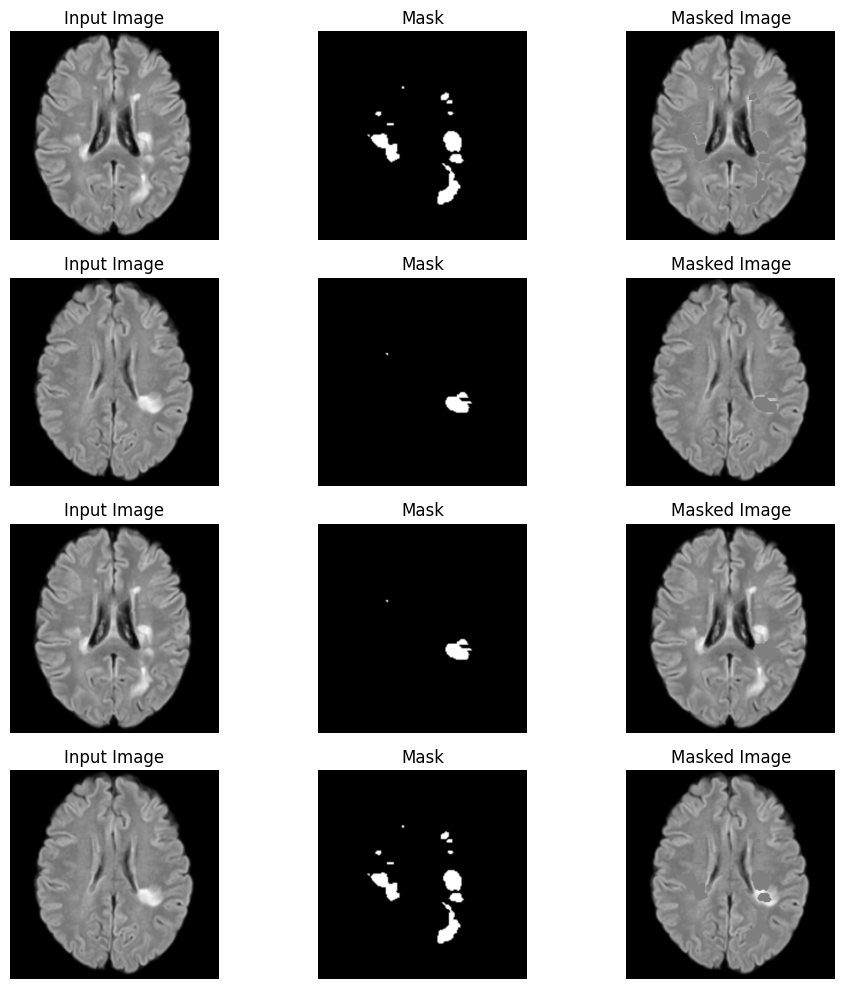

In [4]:
# ---- Load and preprocess ----
input_image = load_image_rgb(image_path)
mask_image = load_image_rgb(mask_path, mask=True)
input_image2 = load_image_rgb(image_path2)
mask_image2 = load_image_rgb(mask_path2, mask=True)

# ---- Prepare masked images ----
mask, masked_image = prepare_and_unormalize(input_image, mask_image, black_mask=False, discretize_mask=False)
mask2, masked_image2 = prepare_and_unormalize(input_image2, mask_image2, black_mask=False, discretize_mask=False)
mask12, masked_image12 = prepare_and_unormalize(input_image, mask_image2, black_mask=False, discretize_mask=False)
mask21, masked_image21 = prepare_and_unormalize(input_image2, mask_image, black_mask=False, discretize_mask=False)

# ---- Plot results ----
titles = ["Input Image", "Mask", "Masked Image"]
rows = [
    [input_image, mask_image, masked_image],
    [input_image2, mask_image2, masked_image2],
    [input_image, mask_image2, masked_image12],
    [input_image2, mask_image, masked_image21],
]

plot_image_rows(rows, titles)


In [5]:
def load_inpainting_pipeline(model_path, device):
    pipe = StableDiffusionInpaintPipeline.from_pretrained(
        model_path,
        torch_dtype=torch.float32,
        safety_checker=None,
    )
    pipe.scheduler = DDIMScheduler.from_config(pipe.scheduler.config)
    pipe.set_progress_bar_config(disable=True)
    return pipe.to(device)

pipe_old = load_inpainting_pipeline("../lesion-inpating-dreambooth-model-new", device)
pipe = load_inpainting_pipeline("../lesion-inpating-dreambooth-model-traintest", device)
pipe_all = load_inpainting_pipeline("../lesion-inpating-dreambooth-model-traintestall", device)


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_inpaint.StableDiffusionInpaintPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


In [6]:
# # take only the biggest lwhite region in the mask_lesion
# from skimage.measure import label, regionprops

# mask_lesion = np.array(mask_image.convert("L"))
# mask_lesion[mask_lesion < 0.5] = 0
# mask_lesion[mask_lesion >= 0.5] = 1
# label_image = label(mask_lesion)
# regions = regionprops(label_image)
# max_area = 0
# max_region = None
# j = 0
# for region in regions:
#     # if region.area > max_area:
#     max_area = region.area
#     max_region = region
#     j += 1
#     if j > 8:
#         break
# mask_lesion = np.zeros_like(mask_lesion)
# mask_lesion[max_region.coords[:, 0], max_region.coords[:, 1]] = 255

# # make the lesion bigger
# from skimage.morphology import binary_dilation, disk
# print(mask_lesion.shape, mask_lesion.dtype, mask_lesion.max())
# mask_lesion = binary_dilation(mask_lesion, disk(15))
# mask_lesion = mask_lesion.astype(np.uint8) * 255

# print(mask_lesion.shape, mask_lesion.dtype, mask_lesion.max())


# mask_lesion = torch.from_numpy(mask_lesion).to(device)
# mask_lesion = transforms.ToPILImage()(mask_lesion.cpu())
# mask_lesion = mask_lesion.convert("RGB")



Original mask_image2:
  Type: <class 'PIL.Image.Image'>
  Size (width, height): (512, 512)
  Min value: 0
  Max value: 255



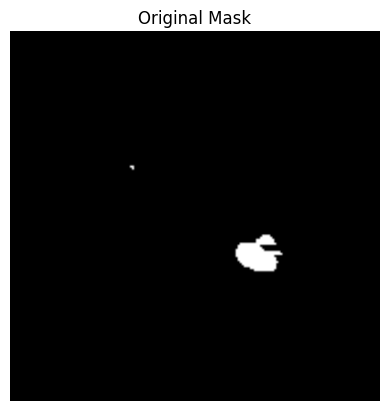

Pixels set to 255 before: 1663
Pixels set to 255 after: 3013


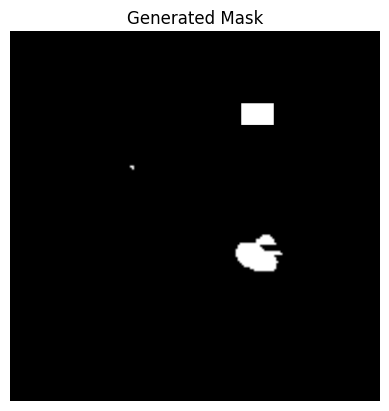

Mask generated. Size: (30, 45), position: (100, 320)
Updated mask_image2:
  Type: <class 'PIL.Image.Image'>
  Size (width, height): (512, 512)
  Min value: 0
  Max value: 255



In [7]:
print_info(mask_image2, "Original mask_image2")
show_image(mask_image2, "Original Mask", cmap="gray")

mask_size = (30, 45)
mask_position = (100, 320)

mask_image2 = add_white_rectangle_to_mask(mask_image2, position=mask_position, size=mask_size)

show_image(mask_image2, "Generated Mask")
print(f"Mask generated. Size: {mask_size}, position: {mask_position}")
print_info(mask_image2, "Updated mask_image2")


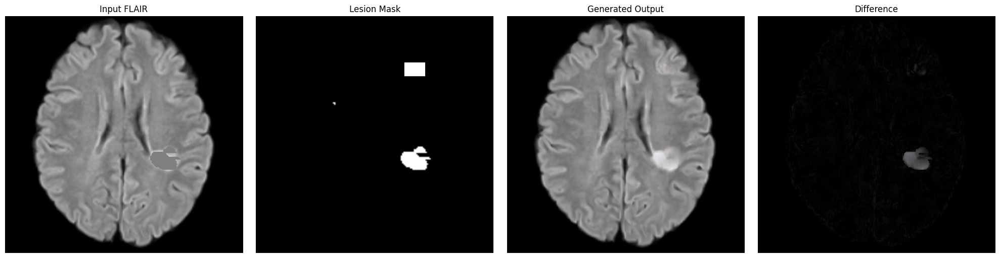

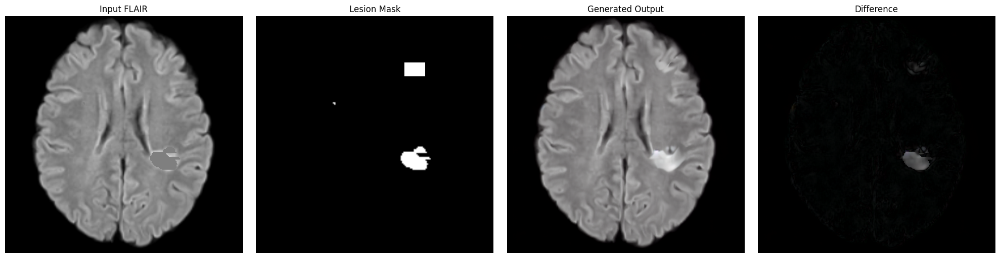

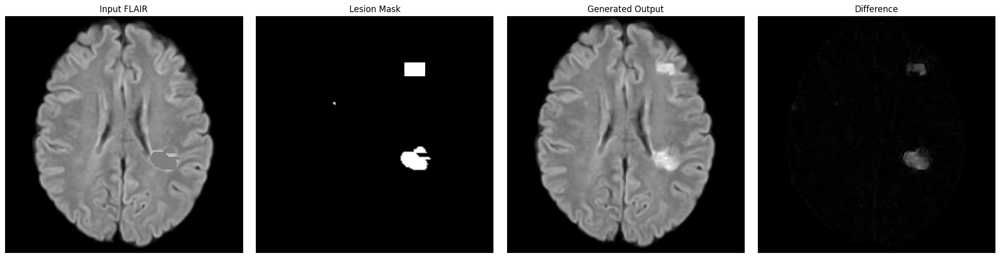

In [ ]:
output_img_old, diff_img_old = generate_lesion_with_diffusion(pipe=pipe_old, input_image=masked_image2, mask_image=mask_image2)
output_img, diff_img = generate_lesion_with_diffusion(pipe=pipe, input_image=masked_image2, mask_image=mask_image2)
output_img_all, diff_img_all = generate_lesion_with_diffusion(pipe=pipe_all, input_image=masked_image2, mask_image=mask_image2)

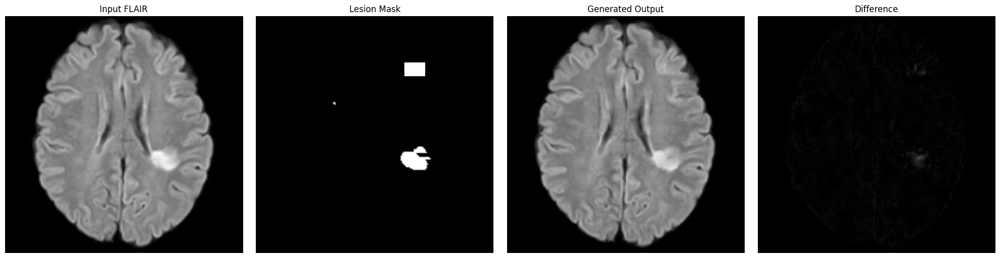

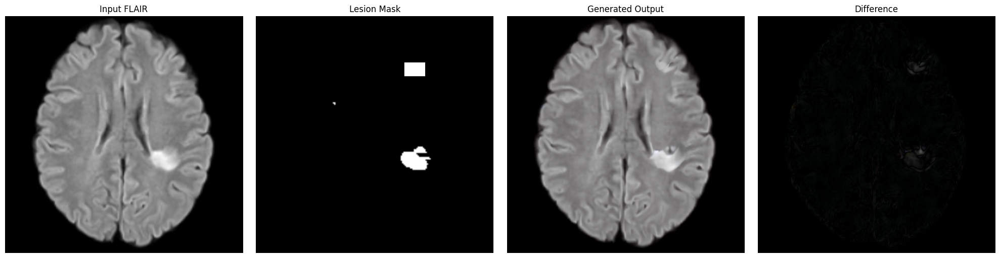

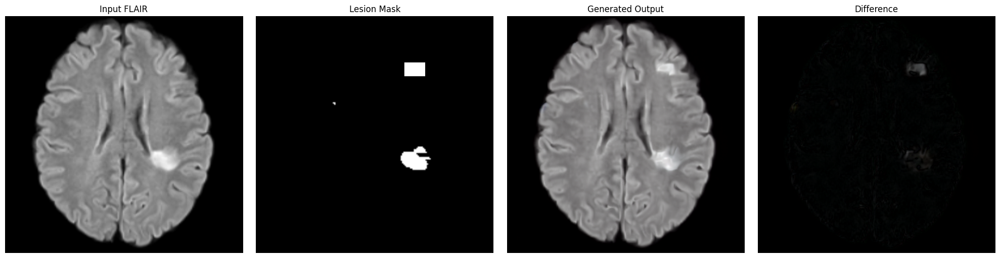

In [10]:
output_img_old, diff_img_old = generate_lesion_with_diffusion(pipe=pipe_old, input_image=input_image2, mask_image=mask_image2)
output_img, diff_img = generate_lesion_with_diffusion(pipe=pipe, input_image=input_image2, mask_image=mask_image2)
output_img_all, diff_img_all = generate_lesion_with_diffusion(pipe=pipe_all, input_image=input_image2, mask_image=mask_image2)

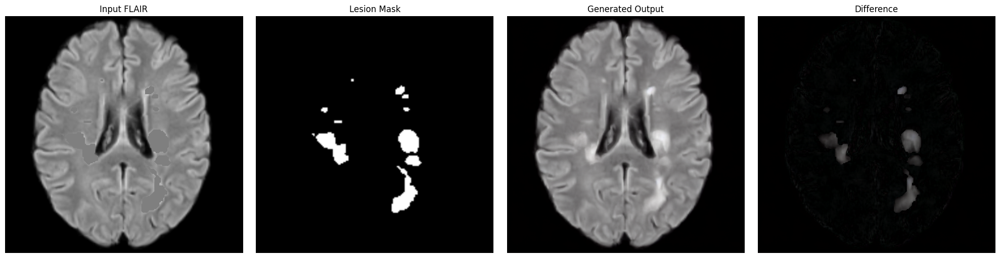

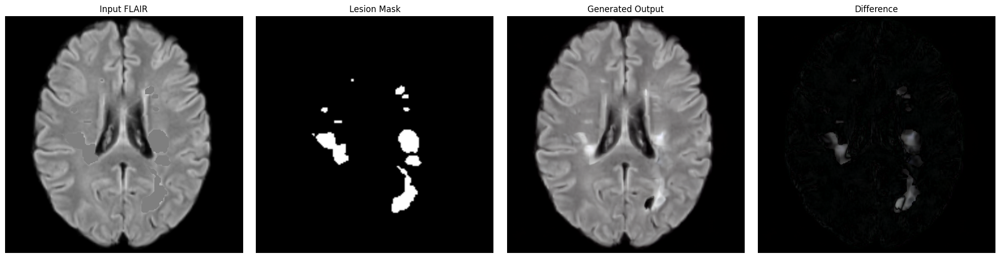

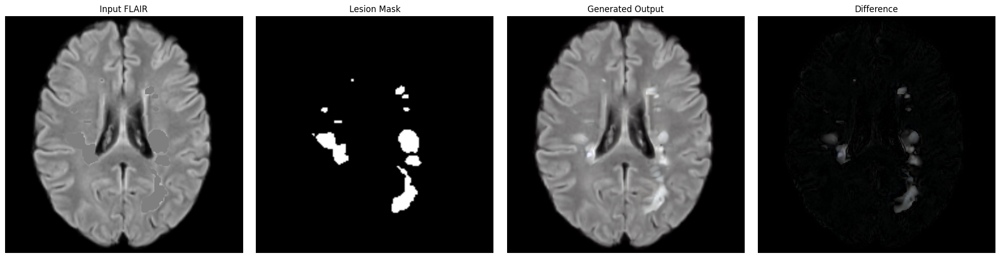

In [11]:
output_img_old, diff_img_old = generate_lesion_with_diffusion(pipe=pipe_old, input_image=masked_image, mask_image=mask_image)
output_img, diff_img = generate_lesion_with_diffusion(pipe=pipe, input_image=masked_image, mask_image=mask_image)
output_img_all, diff_img_all = generate_lesion_with_diffusion(pipe=pipe_all, input_image=masked_image, mask_image=mask_image)

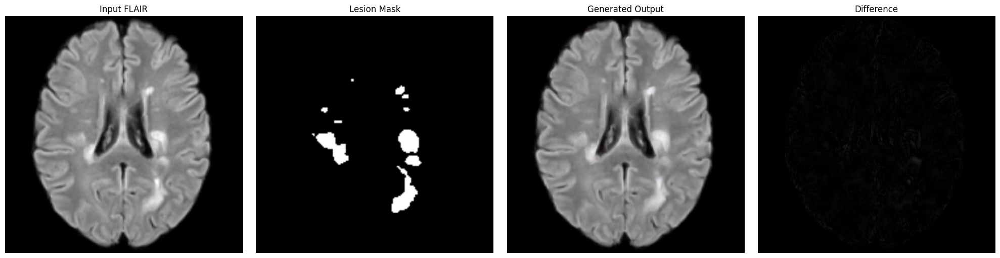

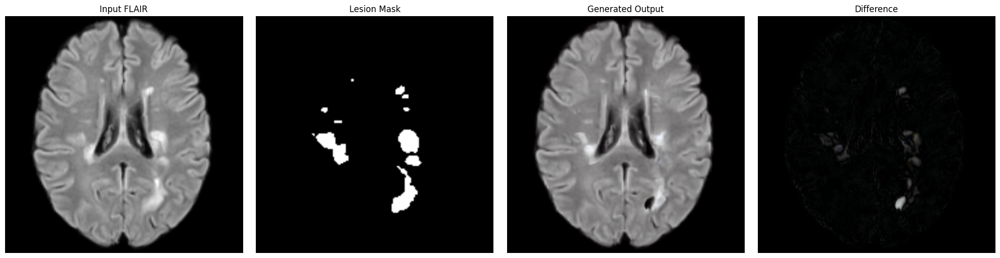

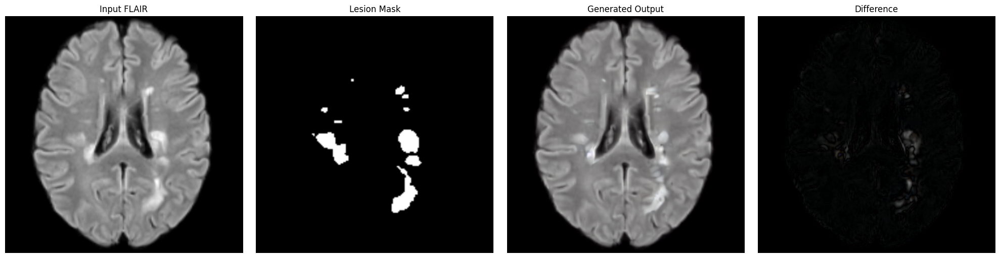

In [12]:
output_img_old, diff_img_old = generate_lesion_with_diffusion(pipe=pipe_old, input_image=input_image, mask_image=mask_image)
output_img, diff_img = generate_lesion_with_diffusion(pipe=pipe, input_image=input_image, mask_image=mask_image)
output_img_all, diff_img_all = generate_lesion_with_diffusion(pipe=pipe_all, input_image=input_image, mask_image=mask_image)

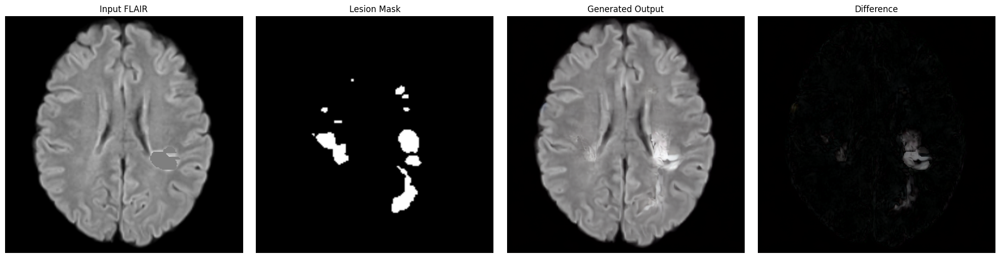

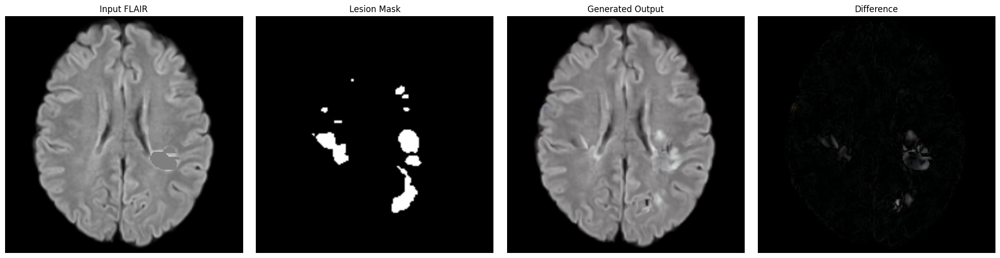

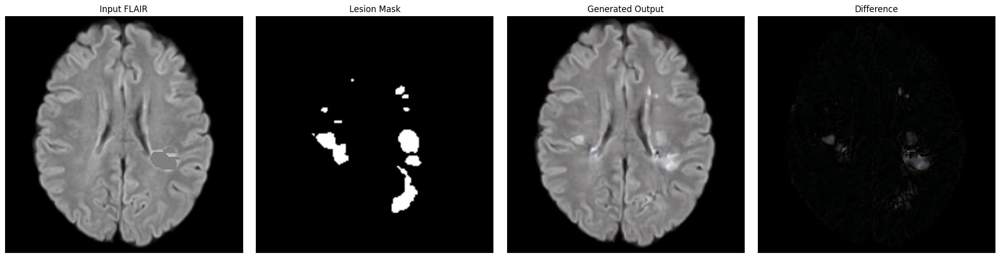

In [13]:
output_img_old, diff_img_old = generate_lesion_with_diffusion(pipe=pipe_old, input_image=masked_image2, mask_image=mask_image)
output_img, diff_img = generate_lesion_with_diffusion(pipe=pipe, input_image=masked_image2, mask_image=mask_image)
output_img_all, diff_img_all = generate_lesion_with_diffusion(pipe=pipe_all, input_image=masked_image2, mask_image=mask_image)

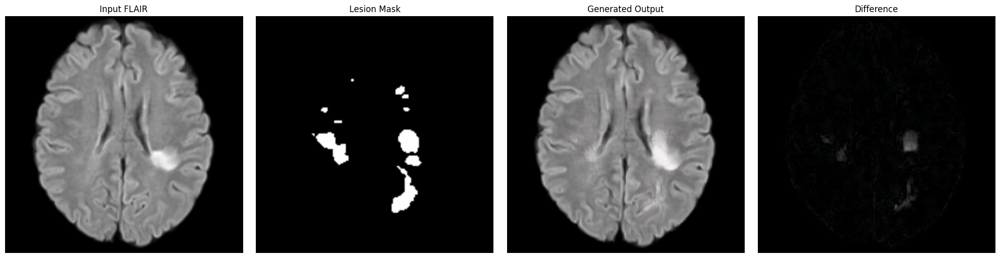

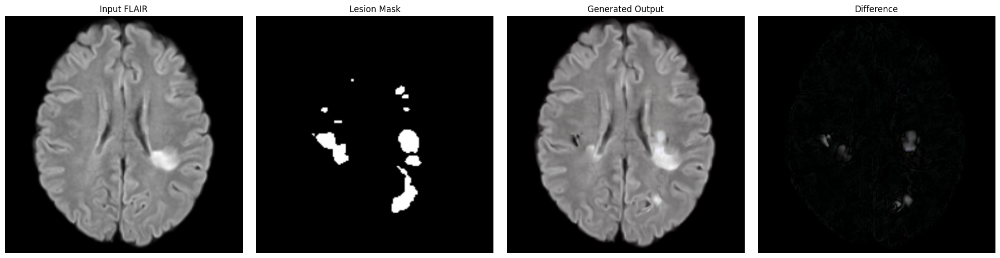

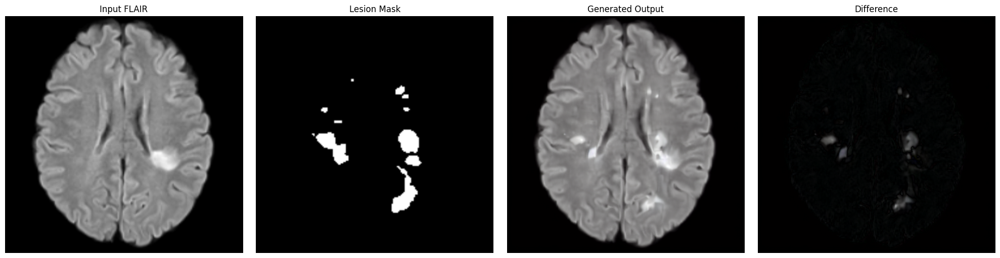

In [14]:
output_img_old, diff_img_old = generate_lesion_with_diffusion(pipe=pipe_old, input_image=input_image2, mask_image=mask_image)
output_img, diff_img = generate_lesion_with_diffusion(pipe=pipe, input_image=input_image2, mask_image=mask_image)
output_img_all, diff_img_all = generate_lesion_with_diffusion(pipe=pipe_all, input_image=input_image2, mask_image=mask_image)

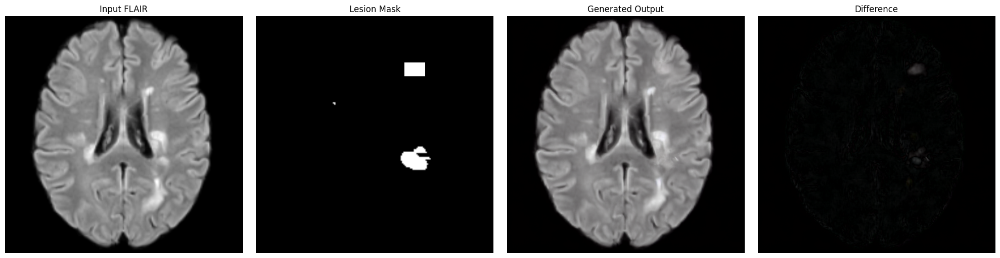

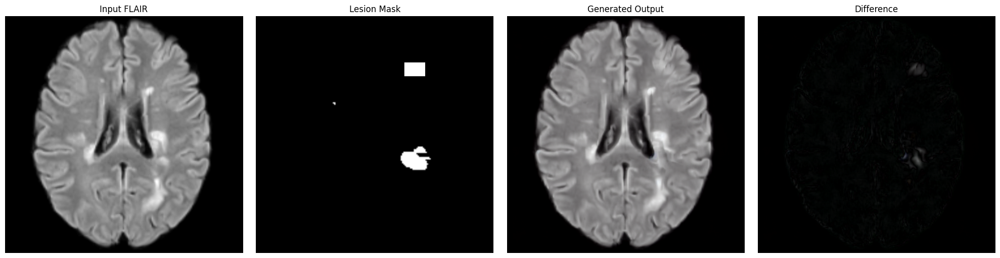

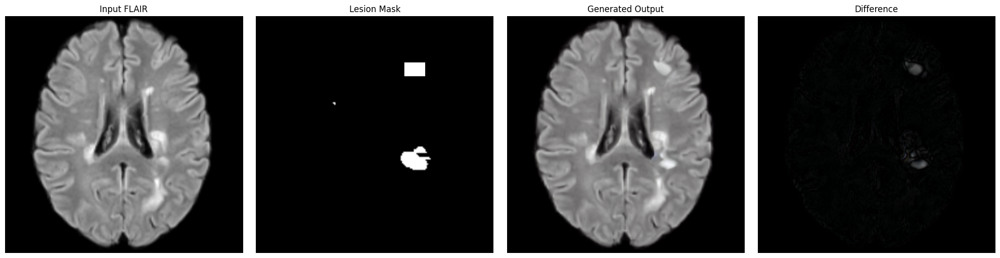

In [16]:
output_img_old, diff_img_old = generate_lesion_with_diffusion(pipe=pipe_old, input_image=input_image, mask_image=mask_image2)
output_img, diff_img = generate_lesion_with_diffusion(pipe=pipe, input_image=input_image, mask_image=mask_image2)
output_img_all, diff_img_all = generate_lesion_with_diffusion(pipe=pipe_all, input_image=input_image, mask_image=mask_image2)